# TADI: Practical work 1
## Mathematical morphology
### Sorbonne Université 2024
### GRUSS Carlos, RCHAKI Oussama

## Imports

In [1]:
import numpy as np
import platform
import tempfile
import os
import matplotlib.pyplot as plt
import scipy 
import skimage

from scipy import ndimage as ndi
from skimage import io as skio
import skimage.morphology as morpho 
from skimage.segmentation import watershed 
from skimage.draw import line
import skimage.feature as skf
from skimage.morphology import disk, dilation, erosion, opening, closing
from skimage import measure

## Auxiliary functions

In [2]:
def viewimage(im,normalise=True,MINI=0.0, MAXI=255.0):
    """ Cette fonction fait afficher l'image EN NIVEAUX DE GRIS 
        dans gimp. Si un gimp est deja ouvert il est utilise.
        Par defaut normalise=True. Et dans ce cas l'image est normalisee 
        entre 0 et 255 avant d'être sauvegardee.
        Si normalise=False MINI et MAXI seront mis a 0 et 255 dans l'image resultat
    """
    imt=np.float32(im.copy())
    if platform.system()=='Darwin': #on est sous mac
        prephrase='open -a GIMP '
        endphrase=' ' 
    elif platform.system()=='Linux': #SINON ON SUPPOSE LINUX (si vous avez un windows je ne sais comment faire. Si vous savez dites-moi.)
        prephrase='gimp '
        endphrase= ' &'
    elif platform.system()=='Windows':
        prephrase='start /B "D:/GIMP/bin/gimp-2.10.exe" -a '#Remplacer D:/... par le chemin de votre GIMP
        endphrase= ''
    else:
        print('Systeme non pris en charge par l affichage GIMP')
        return 'erreur d afficahge'
    if normalise:
        m=imt.min()
        imt=imt-m
        M=imt.max()
        if M>0:
            imt=imt/M

    else:
        imt=(imt-MINI)/(MAXI-MINI)
        imt[imt<0]=0
        imt[imt>1]=1
    
    nomfichier=tempfile.mktemp('TPIMA.png')
    commande=prephrase +nomfichier+endphrase
    skio.imsave(nomfichier,imt)
    os.system(commande)

def viewimage_color(im,normalise=True,MINI=0.0, MAXI=255.0):
    """ Cette fonction fait afficher l'image EN NIVEAUX DE GRIS 
        dans gimp. Si un gimp est deja ouvert il est utilise.
        Par defaut normalise=True. Et dans ce cas l'image est normalisee 
        entre 0 et 255 avant d'être sauvegardee.
        Si normalise=False MINI(defaut 0) et MAXI (defaut 255) seront mis a 0 et 255 dans l'image resultat
        
    """
    imt=np.float32(im.copy())
    if platform.system()=='Darwin': #on est sous mac
        prephrase='open -a GIMP '
        endphrase=' ' 
    elif platform.system()=='Linux': #SINON ON SUPPOSE LINUX (si vous avez un windows je ne sais comment faire. Si vous savez dites-moi.)
        prephrase='gimp '
        endphrase= ' &'
    elif platform.system()=='Windows':
        prephrase='start /B "D:/GIMP/bin/gimp-2.10.exe" -a '#Remplacer D:/... par le chemin de votre GIMP
        endphrase= ''
    else:
        print('Systeme non pris en charge par l affichage GIMP')
        return 'erreur d afficahge'
    
    if normalise:
        m=imt.min()
        imt=imt-m
        M=imt.max()
        if M>0:
            imt=imt/M
    else:
        imt=(imt-MINI)/(MAXI-MINI)
        imt[imt<0]=0
        imt[imt>1]=1
    
    nomfichier=tempfile.mktemp('TPIMA.pgm')
    commande=prephrase +nomfichier+endphrase
    skio.imsave(nomfichier,imt)
    os.system(commande)

def strel(forme,taille,angle=45):
    """renvoie un element structurant de forme  
     'diamond'  boule de la norme 1 fermee de rayon taille
     'disk'     boule de la norme 2 fermee de rayon taille
     'square'   carre de cote taille (il vaut mieux utiliser taille=impair)
     'line'     segment de langueur taille et d'orientation angle (entre 0 et 180 en degres)
      (Cette fonction n'est pas standard dans python)
    """

    if forme == 'diamond':
        return morpho.diamond(taille)
    if forme == 'disk':
        return morpho.disk(taille)
    if forme == 'square':
        return morpho.square(taille)
    if forme == 'line':
        angle=int(-np.round(angle))
        angle=angle%180
        angle=np.float32(angle)/180.0*np.pi
        x=int(np.round(np.cos(angle)*taille))
        y=int(np.round(np.sin(angle)*taille))
        if x**2+y**2 == 0:
            if abs(np.cos(angle))>abs(np.sin(angle)):
                x=int(np.sign(np.cos(angle)))
                y=0
            else:
                y=int(np.sign(np.sin(angle)))
                x=0
        rr,cc=line(0,0,y,x)
        rr=rr-rr.min()
        cc=cc-cc.min()
        img=np.zeros((rr.max()+1,cc.max()+1) )
        img[rr,cc]=1
        return img
    raise RuntimeError('Erreur dans fonction strel: forme incomprise')

def couleurs_alea(im):
    """ 
    Donne des couleurs aleatoires a une image en niveau de gris.
    Cette fonction est utile lorsque le niveua de gris d'interprete comme un numero
      de region. Ou encore pour voir les leger degrades d'une teinte de gris.
      """
    sh=im.shape
    out=np.zeros((sh[0],sh[1],3),dtype=np.uint8)
    nbcoul=np.int32(im.max())
    tabcoul=np.random.randint(0,256,size=(nbcoul+1,3))
    tabcoul[0,:]=0
    for k in range(sh[0]):
        for l in range(sh[1]):
            out[k,l,:]=tabcoul[im[k,l]]
    return out

def gris_depuis_couleur(im):
    """ Transforme une image couleur en image a niveaux de gris"""
    return im[:,:,:3].sum(axis=2)/3

## General comments

For the code to work, all the images used need to be in a directory ``Images`` on the same directory as this notebook. The Python and library versions used are listed below.

In [3]:
print('Python version: ' + platform.python_version())
print('Numpy version: ' + np.__version__)
print('Scikit-image version: ' + skimage.__version__)
print('Scipy version: ' + scipy.__version__)

Python version: 3.12.3
Numpy version: 1.26.4
Scikit-image version: 0.24.0
Scipy version: 1.14.1


## Part 1: Mathematical morphology on gray-scale images

### Question 1

Morphological operations like dilation, erosion, opening, and closing are strongly influenced by the size and shape of the structuring element (SE). These parameters affect how these transformations alter the original image.

1. Influence of Size
- **Larger SE size** leads to more pronounced effects:
  - **Dilation**: Expands bright (foreground) regions, merging nearby objects and thickening structures.
  - **Erosion**: Shrinks foreground objects, potentially removing small features or details.
  - **Opening**: Removes small noise and isolated pixels but can also break apart thin connections between objects.
  - **Closing**: Fills small gaps or holes within objects but may also blur details if the SE is too large.

2. Influence of Shape
- Different **shapes** (e.g., disk, square, diamond, line) determine how the transformation behaves along different directions:
  - A **disk** provides an isotropic effect, meaning it influences all directions equally, suitable for smooth objects.
  - A **square** or **rectangle** emphasizes changes along horizontal and vertical edges, making it effective for structures with sharp corners or grids.
  - A **diamond** influences diagonals more, which can help in analyzing patterns that are not aligned along the standard axes.
  - A **line** is useful when the goal is to detect or enhance features aligned along specific orientations, such as cracks, edges, or fibers.

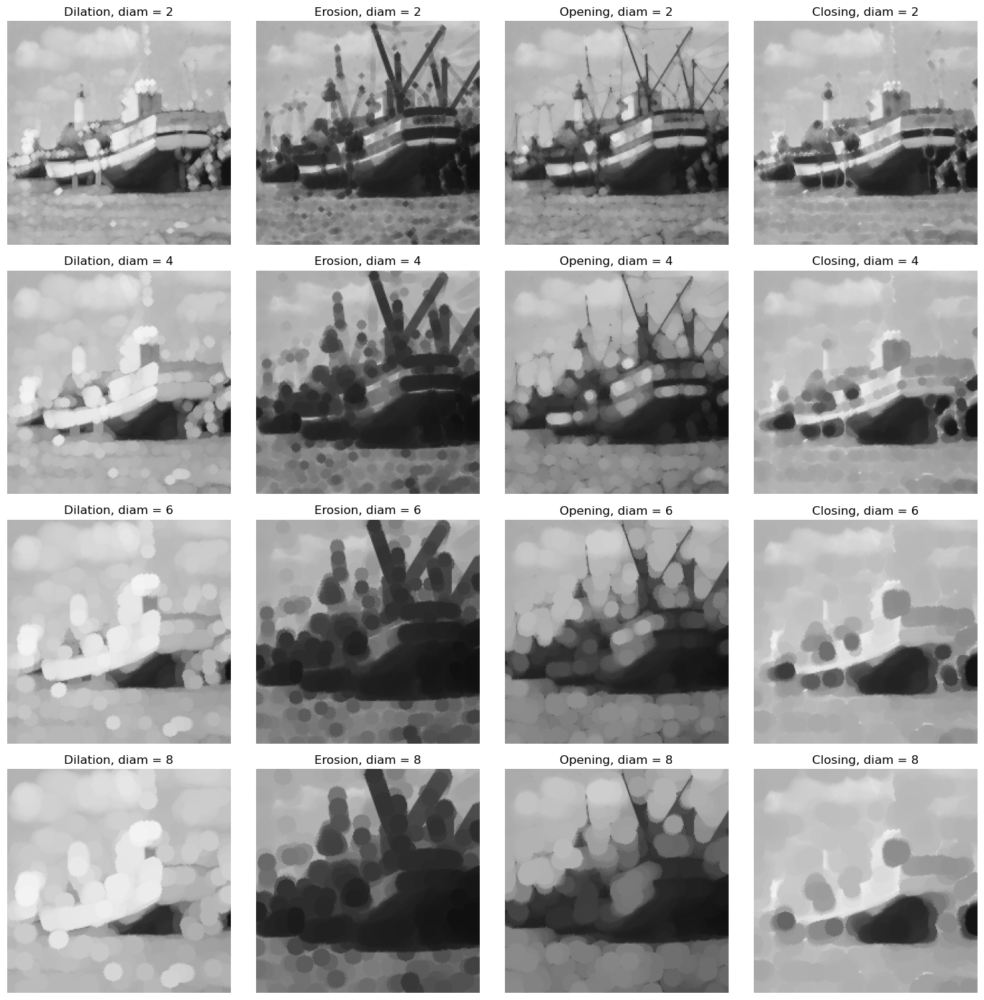

In [4]:
# Load the image
im = skio.imread('./Images/bat200.bmp')
im = gris_depuis_couleur(im)

# Define a list of different diameters for the structuring element
diameters = [2, 4, 6, 8]

# Create a 4x4 grid of subplots
fig, axs = plt.subplots(4, 4, figsize=(14, 14))  # 4 rows, 4 columns

# Loop over each diameter and operation
for i, diametre in enumerate(diameters):
    se = disk(diametre)

    # Apply the morphological operations
    dil = dilation(im, se)
    ero = erosion(im, se)
    open_img = opening(im, se)
    close = closing(im, se)

    # Plot dilation
    axs[i, 0].imshow(dil, cmap='gray', vmin=0, vmax=255)
    axs[i, 0].set_title(f'Dilation, diam = {diametre}')
    axs[i, 0].axis('off')  # Hide axis

    # Plot erosion
    axs[i, 1].imshow(ero, cmap='gray', vmin=0, vmax=255)
    axs[i, 1].set_title(f'Erosion, diam = {diametre}')
    axs[i, 1].axis('off')

    # Plot opening
    axs[i, 2].imshow(open_img, cmap='gray', vmin=0, vmax=255)
    axs[i, 2].set_title(f'Opening, diam = {diametre}')
    axs[i, 2].axis('off')

    # Plot closing
    axs[i, 3].imshow(close, cmap='gray', vmin=0, vmax=255)
    axs[i, 3].set_title(f'Closing, diam = {diametre}')
    axs[i, 3].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

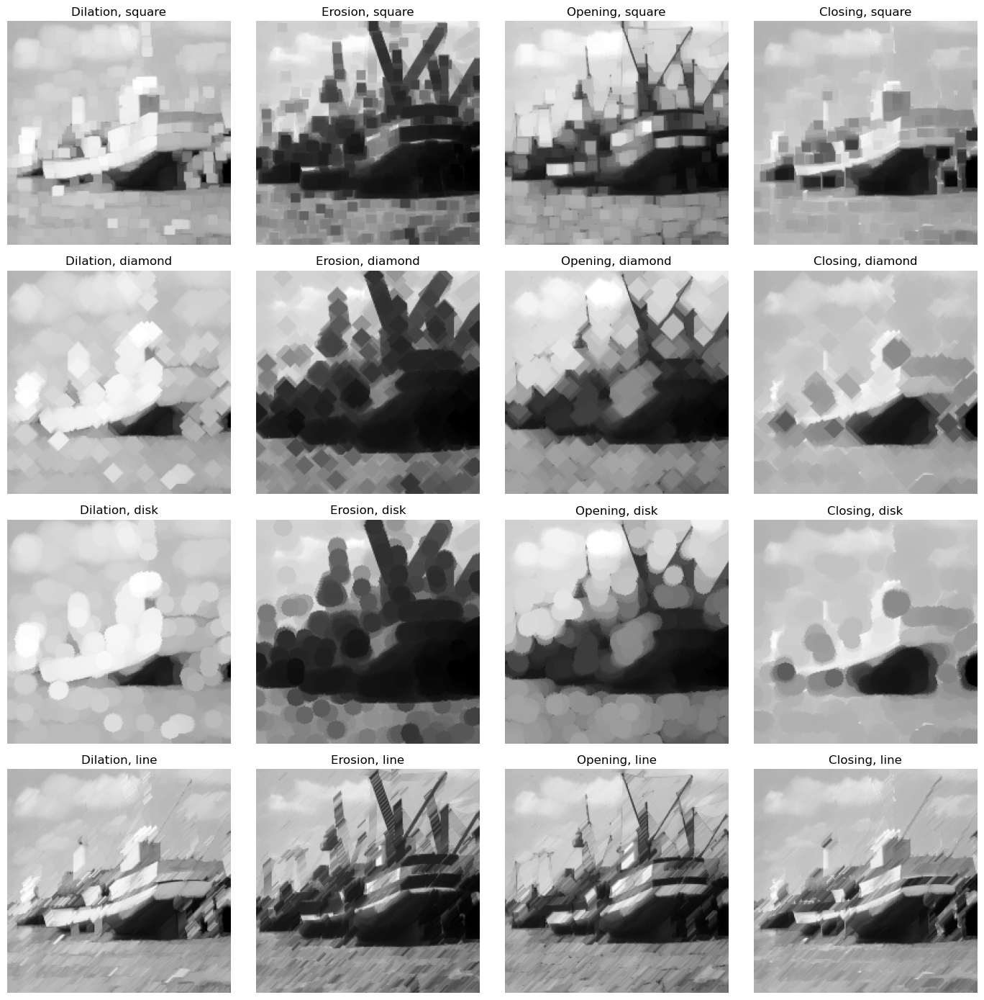

In [5]:


# Define the structuring elements and their names
shapes = ['square','diamond','disk','line']

diameter = 4

# Create a 4x4 grid of subplots
fig, axs = plt.subplots(4, 4, figsize=(14, 14))  # 4 rows, 4 columns

# Loop over each shape and operation
for i, name in enumerate(shapes):

    se=strel(name,diametre,angle=45)
    # Apply the morphological operations
    dil = dilation(im, se)
    ero = erosion(im, se)
    open_img = opening(im, se)
    close = closing(im, se)

    # Plot dilation
    axs[i, 0].imshow(dil, cmap='gray')
    axs[i, 0].set_title(f'Dilation, {name}')
    axs[i, 0].axis('off')  # Hide axis

    # Plot erosion
    axs[i, 1].imshow(ero, cmap='gray')
    axs[i, 1].set_title(f'Erosion, {name}')
    axs[i, 1].axis('off')

    # Plot opening
    axs[i, 2].imshow(open_img, cmap='gray')
    axs[i, 2].set_title(f'Opening, {name}')
    axs[i, 2].axis('off')

    # Plot closing
    axs[i, 3].imshow(close, cmap='gray')
    axs[i, 3].set_title(f'Closing, {name}')
    axs[i, 3].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

### Question 2

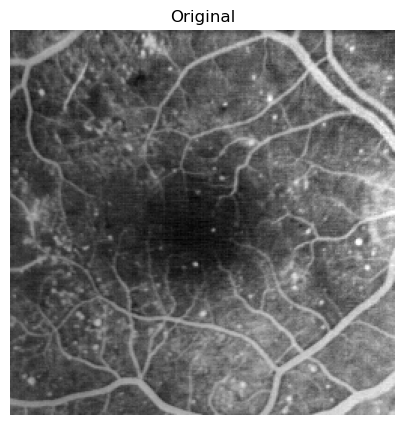

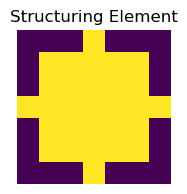

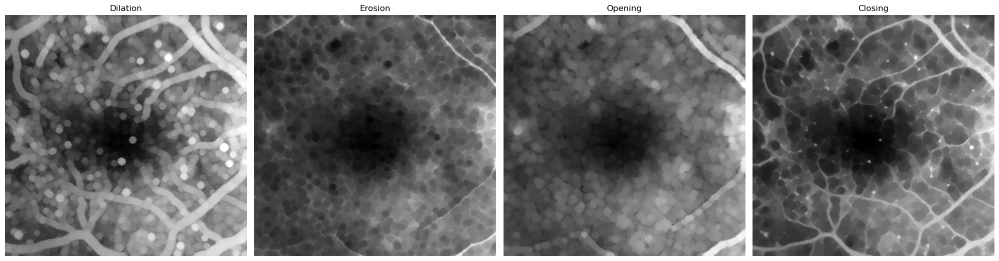

In [6]:
im = skio.imread('./Images/retina2.gif')
im = im[0, :, :]

# Plot original image
plt.figure(figsize=(5, 5))
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original')
plt.show()

se = strel('disk', 3)
plt.figure(figsize=(2, 2))
plt.imshow(se)
plt.axis('off')
plt.title('Structuring Element')
plt.show()

imopen = morpho.opening(im, se)
imclose = morpho.closing(im, se)
imero = morpho.erosion(im, se)
imdil = morpho.dilation(im, se)

plt.figure(figsize=(20, 20))

plt.subplot(1, 4, 1)
plt.imshow(imdil, cmap='gray')
plt.axis('off')
plt.title('Dilation')

plt.subplot(1, 4, 2)
plt.imshow(imero, cmap='gray')
plt.axis('off')
plt.title('Erosion')

plt.subplot(1, 4, 3)
plt.imshow(imopen, cmap='gray')
plt.axis('off')
plt.title('Opening')

plt.subplot(1, 4, 4)
plt.imshow(imclose, cmap='gray')
plt.axis('off')
plt.title('Closing')

plt.tight_layout()
plt.show()


In the previous figure, we can observe a basic example of effects of each of the basic morphological operations. In essence:
- Dilation expands and brightens features.
- Erosion shrinks and darkens features.
- Opening removes small bright details and smooths object boundaries.
- Closing fills small dark gaps and smooths the contours of bright regions.

We will explore if each of the operations is:
- Increasing
- Extensive
- Idempotent

As a comment, the following examples are of course not proofs, and are just used to illustrate the properties.

#### Increasingness:

We say an operator $f$ is increasing iff:
$$
X \subseteq Y \implies f(X, B) \subseteq f(Y, B)
$$

In [7]:
X = im

# Generate an image Y such that every pixel in Y is greater or equal to the corresponding pixel in X
Y = np.random.randint(0, 256, size=X.shape)
Y = np.maximum(X, Y)

erode_X = morpho.erosion(X, se)
erode_Y = morpho.erosion(Y, se)

dilate_X = morpho.dilation(X, se)
dilate_Y = morpho.dilation(Y, se)

open_X = morpho.opening(X, se)
open_Y = morpho.opening(Y, se)

close_X = morpho.closing(X, se)
close_Y = morpho.closing(Y, se)

if (erode_X <= erode_Y).all():
    print('Erosion is increasing')
else:
    print('Erosion is not increasing')

if (dilate_X <= dilate_Y).all():
    print('Dilation is increasing')
else:
    print('Dilation is not increasing')

if (open_X <= open_Y).all():
    print('Opening is increasing')
else:
    print('Opening is not increasing')

if (close_X <= close_Y).all():
    print('Closing is increasing')
else:
    print('Closing is not increasing')

Erosion is increasing
Dilation is increasing
Opening is increasing
Closing is increasing


#### Extensiveness:

We say an operator $f$ is extensive iff:

$$
X \subseteq f(X, B) 
$$

We say an operator $f$ is anti-extensive iff:

$$
f(X, B) \subseteq X   
$$

In [8]:
X = im

erode_X = morpho.erosion(X, se)
dilate_X = morpho.dilation(X, se)
open_X = morpho.opening(X, se)
close_X = morpho.closing(X, se)

if (erode_X <= X).all():
    print('Erosion is anti-extensive')
elif (erode_X >= X).all():
    print('Erosion is extensive')
else:
    print('Erosion is not anti-extensive nor extensive')

if (dilate_X <= X).all():
    print('Dilation is anti-extensive')
elif (dilate_X >= X).all():
    print('Dilation is extensive')
else:
    print('Dilation is not anti-extensive nor extensive')

if (open_X <= X).all():
    print('Opening is anti-extensive')
elif (open_X >= X).all():
    print('Opening is extensive')
else:
    print('Opening is not anti-extensive nor extensive')

if (close_X <= X).all():
    print('Closing is anti-extensive')
elif (close_X >= X).all():
    print('Closing is extensive')
else:
    print('Closing is not anti-extensive nor extensive')

Erosion is anti-extensive
Dilation is extensive
Opening is anti-extensive
Closing is extensive


#### Idempotence:

We say an operator $f$ is extensive iff:

$$
f(f(X)) = f(X)
$$

In [9]:
X = im

erode_X = morpho.erosion(X, se)
dilate_X = morpho.dilation(X, se)
open_X = morpho.opening(X, se)
close_X = morpho.closing(X, se)

if (morpho.erosion(erode_X, se) == erode_X).all():
    print('Erosion is idempotent')
else:
    print('Erosion is not idempotent')

if (morpho.dilation(dilate_X, se) == dilate_X).all():
    print('Dilation is idempotent')
else:
    print('Dilation is not idempotent')

if (morpho.opening(open_X, se) == open_X).all():
    print('Opening is idempotent')
else:
    print('Opening is not idempotent')

if (morpho.closing(close_X, se) == close_X).all():
    print('Closing is idempotent')
else:
    print('Closing is not idempotent')

Erosion is not idempotent
Dilation is not idempotent
Opening is idempotent
Closing is idempotent


Finally, we explore the following duality properties of these morphological operators:

- $\left( X \ominus B \right)^c = \left( X^c \oplus \hat{B} \right)$
- $\left( X \oplus B \right)^c = \left( X^c \ominus \hat{B} \right)$
- $\left( X \circ B \right)^c = \left( X^c \bullet \hat{B} \right)$
- $\left( X \bullet B \right)^c = \left( X^c \circ \hat{B} \right)$

Where $\hat{B}$ is a structuring element symmetrical of $B$.

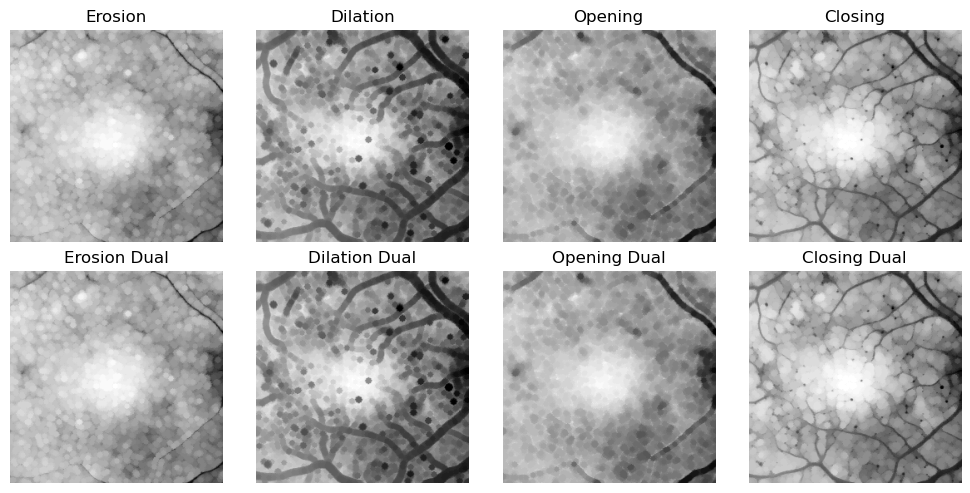

In [10]:
X = im
X_comp = 255 - X

erode_X = morpho.erosion(X, se)
dilate_X = morpho.dilation(X, se)
open_X = morpho.opening(X, se)
close_X = morpho.closing(X, se)

# Take the complement of each operation
erode_X_comp = 255 - erode_X
dilate_X_comp = 255 - dilate_X
open_X_comp = 255 - open_X
close_X_comp = 255 - close_X

# Perform the corresponding operation on the complement
erode_X_comp_dual = morpho.dilation(X_comp, se)
dilate_X_comp_dual = morpho.erosion(X_comp, se)
open_X_comp_dual = morpho.closing(X_comp, se)
close_X_comp_dual = morpho.opening(X_comp, se)

# Plot the dual operations
plt.figure(figsize=(10, 5))
plt.subplot(2, 4, 1)
plt.imshow(erode_X_comp, cmap='gray')
plt.axis('off')
plt.title('Erosion')

plt.subplot(2, 4, 2)
plt.imshow(dilate_X_comp, cmap='gray')
plt.axis('off')
plt.title('Dilation')

plt.subplot(2, 4, 3)
plt.imshow(open_X_comp, cmap='gray')
plt.axis('off')
plt.title('Opening')

plt.subplot(2, 4, 4)
plt.imshow(close_X_comp, cmap='gray')
plt.axis('off')
plt.title('Closing')

plt.subplot(2, 4, 5)
plt.imshow(erode_X_comp_dual, cmap='gray')
plt.axis('off')
plt.title('Erosion Dual')

plt.subplot(2, 4, 6)
plt.imshow(dilate_X_comp_dual, cmap='gray')
plt.axis('off')
plt.title('Dilation Dual')

plt.subplot(2, 4, 7)
plt.imshow(open_X_comp_dual, cmap='gray')
plt.axis('off')
plt.title('Opening Dual')

plt.subplot(2, 4, 8)
plt.imshow(close_X_comp_dual, cmap='gray')
plt.axis('off')
plt.title('Closing Dual')

plt.tight_layout()
plt.show()

### Question 3

The succession of a **dilation** by a square of size $3 \times 3$ followed by a dilation by a square of size $5 \times 5$ is equivalent to a single dilation with a square of size $7 \times 7$. This follows from the **idempotence property** of dilation: the combined effect of two dilations is equivalent to a single dilation with a structuring element of size equal to the sum minus one, i.e., $3 + 5 - 1 = 7$.

$$
D[D(X,B),B_0]=D[X,B \oplus B_0]
$$

Similarly, the succession of two **openings** with squares of sizes $3 \times 3$ and $5 \times 5$ is equivalent to a single opening with a square of size $5 \times 5$. This is explained by the **absorption property** of opening: once noise smaller than the larger structuring element is removed, further openings with smaller elements have no additional effect.

$$
(X_n)_{n'}=(X)_{max(n,n')}
$$

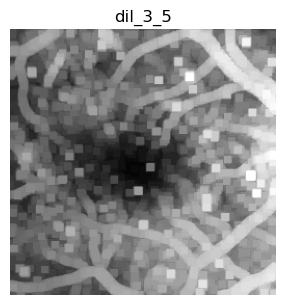

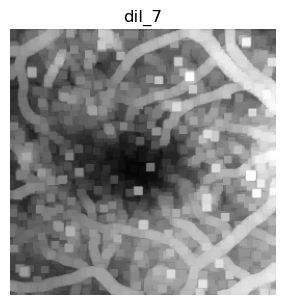

The succession of a dilation by a square of size 3×3 and a dilation by a square of size 5×5 is equivalent to a dilation of 7x7


In [11]:
im = skio.imread('./Images/retina2.gif')
im = im[0, :, :]

#The succession of a dilation by a square of size 3×3 and a dilation by a square of size 5 × 5
se=strel("square",3)
dil_3 = morpho.dilation(im, se)
se=strel("square",5)
dil_3_5=morpho.dilation(dil_3, se)
plt.figure(figsize=(20, 20))
plt.subplot(5, 4, 1)
plt.imshow(dil_3_5, cmap='gray')
plt.axis('off')
plt.title('dil_3_5')
plt.show()
se=strel("square",7)
dil_7=morpho.dilation(im,se)
plt.figure(figsize=(20, 20))
plt.subplot(5, 4, 1)
plt.imshow(dil_7, cmap='gray')
plt.axis('off')
plt.title('dil_7')
plt.show()

if (dil_7==dil_3_5).all() :
    print("The succession of a dilation by a square of size 3×3 and a dilation by a square of size 5×5 is equivalent to a dilation of 7x7")

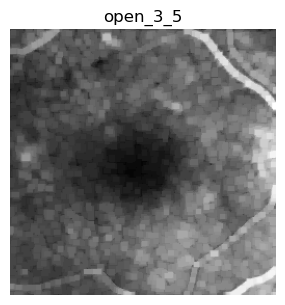

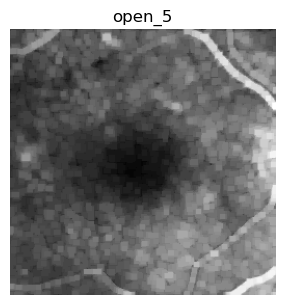

The succession of an opening by a square of size 3×3 and an opening by a square of size 5×5 is equivalent to an opening of 5x5


In [12]:
#The succession of a dilation by a square of size 3×3 and a dilation by a square of size 5 × 5
se=strel("square",3)
open_3 = morpho.opening(im, se)
se=strel("square",5)
open_3_5=morpho.opening(open_3, se)
plt.figure(figsize=(20, 20))
plt.subplot(5, 4, 1)
plt.imshow(open_3_5, cmap='gray')
plt.axis('off')
plt.title('open_3_5')
plt.show()
se=strel("square",5)
open_5=morpho.opening(im,se)
plt.figure(figsize=(20, 20))
plt.subplot(5, 4, 1)
plt.imshow(open_5, cmap='gray')
plt.axis('off')
plt.title('open_5')
plt.show()

if (open_5==open_3_5).all() :
    print("The succession of an opening by a square of size 3×3 and an opening by a square of size 5×5 is equivalent to an opening of 5x5")

### Question 4

The top-hat transform (or "white top-hat") return an image with the elements in the image that:
- Are "smaller" than the structuring element (the structuring element doesn't fit),
- and have higher intensity than their surroundings.

Below we can see this illustrated by varying the structuring element size.

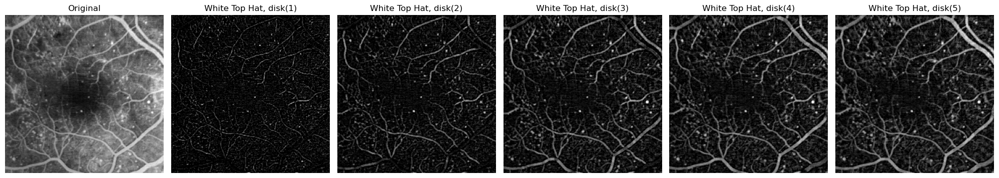

In [13]:
im = skio.imread('./Images/retina2.gif')
im = im[0, :, :]

se = strel('disk', 3)

# Apply white top hat for different sized disks
plt.figure(figsize=(20, 20))
plt.subplot(1, 6, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original')

for i in range(1, 6):
    se = strel('disk', i)
    imwth = im - morpho.opening(im, se)
    plt.subplot(1, 6, i+1)
    plt.imshow(imwth, cmap='gray')
    plt.axis('off')
    plt.title(f'White Top Hat, disk({i})')

plt.tight_layout()
plt.show()

The dual operation is called the bottom-hat transform, or black top-hat. Conversely, it returns an image with elements, that are:
- Fit into the structuring element,
- and are darker than their surroundings. 

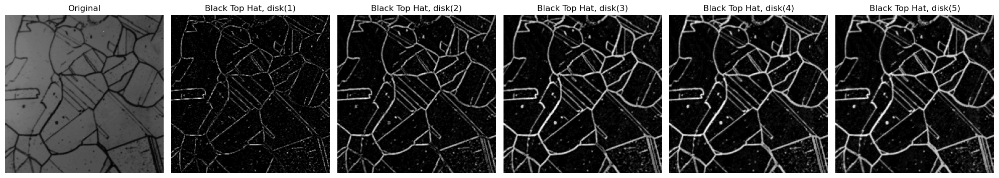

In [14]:
im = skio.imread('./Images/laiton.bmp')
im = gris_depuis_couleur(im)

# Apply black top hat for different sized disks
plt.figure(figsize=(20, 20))
plt.subplot(1, 6, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original')

for i in range(1, 6):
    se = strel('disk', i)
    imbth = morpho.closing(im, se) - im
    plt.subplot(1, 6, i+1)
    plt.imshow(imbth, cmap='gray')
    plt.axis('off')
    plt.title(f'Black Top Hat, disk({i})')

plt.tight_layout()
plt.show()

### Question 5

By applying morphological opening with a line segment in multiple directions, small objects (which may represent noise) are effectively removed, and the contours are smoothed in all directions. This process results in a cleaner and clearer output, as illustrated below. Therefore, this method can be regarded as an effective approach for noise reduction and contour smoothing.

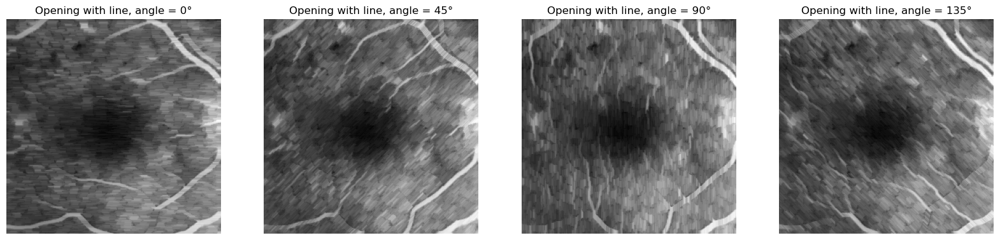

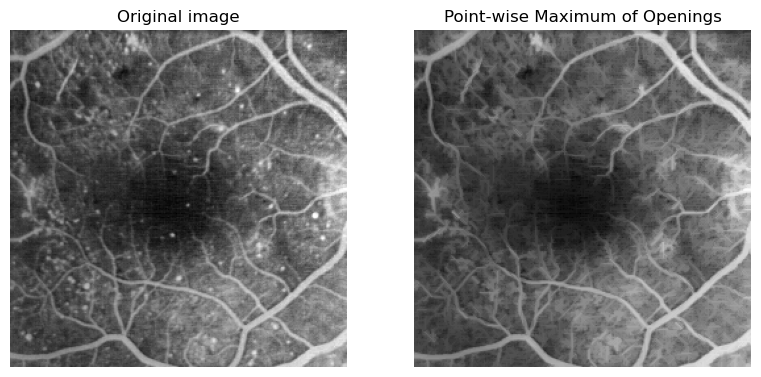

In [15]:
im = skio.imread('./Images/retina2.gif')
im = im[0, :, :]

se_0=strel("line",6,0)
se_45=strel("line",6,45)
se_90=strel("line",6,90)
se_135=strel("line",6,135)
open_0=morpho.opening(im, se_0)
open_45=morpho.opening(im, se_45)
open_90=morpho.opening(im, se_90)
open_135=morpho.opening(im, se_135)

# Display the results in a grid
angles = [0, 45, 90, 135]
openings = [open_0, open_45, open_90, open_135]

plt.figure(figsize=(20, 20))
for j, (angle, opened_image) in enumerate(zip(angles, openings), start=1):
    plt.subplot(1, 4, j)  # Adjust subplot to fit all in one row
    plt.imshow(opened_image, cmap='gray')
    plt.axis('off')
    plt.title(f'Opening with line, angle = {angle}°')

plt.show()

# Compute the point-wise maximum of all the opened images
max_opening = np.maximum.reduce([open_0, open_45, open_90, open_135])

# Display the result
plt.figure(figsize=(20, 20))

plt.subplot(1, 4,1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original image')

plt.subplot(1, 4,2)
plt.imshow(max_opening, cmap='gray')
plt.axis('off')
plt.title('Point-wise Maximum of Openings')
plt.show()

## Part 2: Alternate sequential filters

Alternate sequential morphological filters are used to smooth and simplify an image by applying a sequence of erosions and dilations. This process helps in removing small details and noise while retaining larger structural elements. As the structuring elements used in the filter grow in size, the image becomes progressively more simplified, leaving only the most prominent features and removing fine details. Additionally, as the number of iterations increases, the effect of the structuring element becomes more apparent in the processed image.

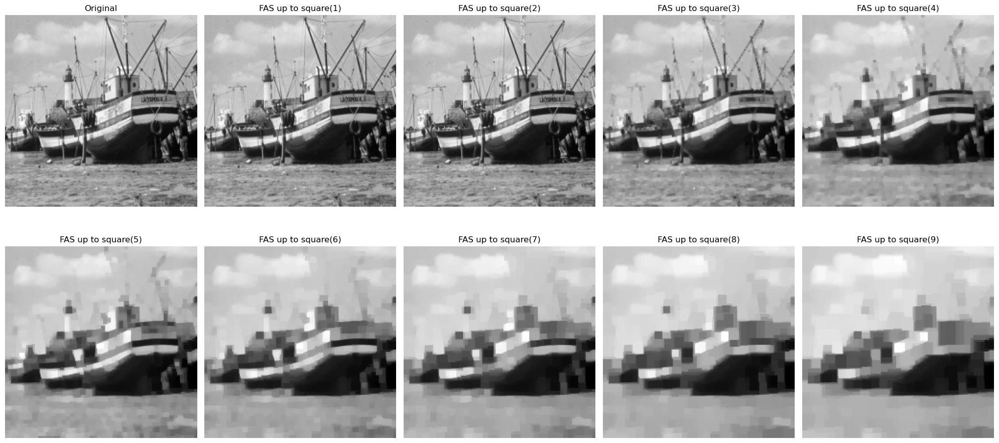

In [16]:
# define a function that computes the alternate sequential filter up to a given number of iterations
def alternate_sequential_filter(im, n, se_type='disk'):
    se = strel(se_type, 1)
    fas = morpho.closing(morpho.opening(im, se), se)
    for i in range(2, n):
        se = strel(se_type, i)
        fas = morpho.closing(morpho.opening(fas, se), se)
    return fas

# Alternate sequential filter
im = skio.imread('./Images/bat200.bmp')
im = gris_depuis_couleur(im)

max_iter = np.arange(1, 10)
num_filters = len(max_iter)
se_type = 'square'

plt.figure(figsize=(20, 10))
plt.subplot(num_filters // 5 + 1, 5, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original')

for i, n in enumerate(max_iter):
    fas = alternate_sequential_filter(im, n, se_type=se_type)
    plt.subplot(num_filters // 5 + 1, 5, i+2)
    plt.imshow(fas, cmap='gray')
    plt.axis('off')
    plt.title(f'FAS up to {se_type}({n})')

plt.tight_layout()
plt.show()

## Part 3: Reconstruction

### Question 1

Performing the opening operation on an image helps remove small local maxima, making it useful for tasks like noise reduction. However, it can also degrade image quality by introducing destructive blurring. Morphological reconstruction offers a way to make such operations more robust by preserving the beneficial effects of opening while mitigating its negative impact on image quality. As we can observe, after reconstruction, the image retains fewer of the small bright spots, while preserving most of the original details.

This process works by applying sequential dilations to the opened image, which increases the overall intensity. However, by using the original image as a mask, the reconstruction constrains the maximum intensity each pixel can reach, thus recovering most of the original image eventually.

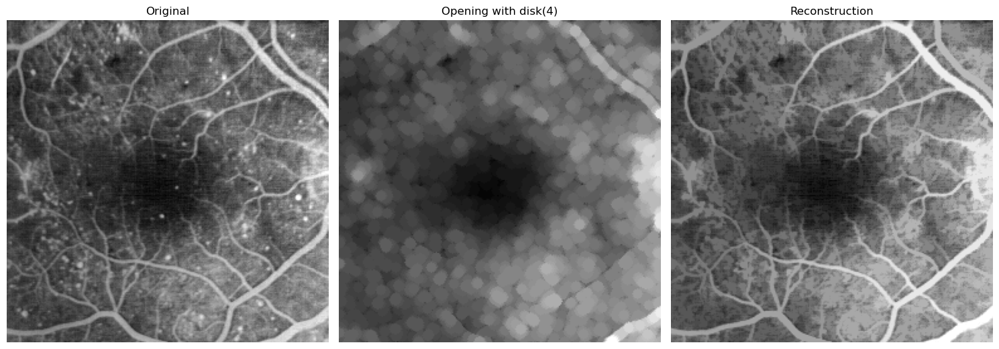

In [17]:
im = skio.imread('./Images/retina2.gif')
im = im[0,:,:]

se = strel('disk',4);
imopen = morpho.opening(im, se)
reco = morpho.reconstruction(imopen, im)

plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original')

plt.subplot(1, 3, 2)
plt.imshow(imopen, cmap='gray')
plt.axis('off')
plt.title('Opening with disk(4)')

plt.subplot(1, 3, 3)
plt.imshow(reco, cmap='gray')
plt.axis('off')
plt.title('Reconstruction')

plt.tight_layout()
plt.show()

### Question 2

To derive this reconstruction using the duality principle from a reconstruction by dilation, the following steps are required: first, the image is inverted. Next, a morphological opening is performed on the inverted image. Then, the image is reconstructed through dilation. Finally, the reconstructed image is inverted again to obtain the desired result. This is deduced from the following formula:

$$
E(X,B)=[D(X^{c},B)^{c}]
$$

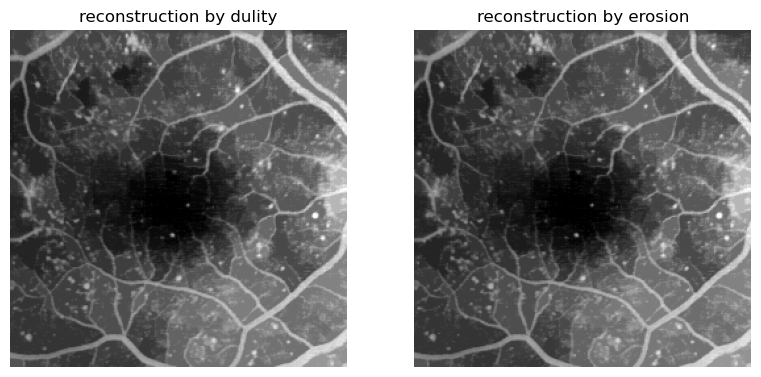

the two reconstructions are equivalent


In [18]:
#Reconstruction by duality
im = skio.imread('./Images/retina2.gif')
im = im[0,:,:]

inv = 255 - im
se = strel('diamond',4)
open4 = morpho.opening(inv, se)
reco = 255 - morpho.reconstruction(open4, inv)
#Reconstruction by erosion
open2 = morpho.closing(im, se)
reco2=morpho.reconstruction(open2, im, method='erosion')


# Display the result
plt.figure(figsize=(20, 20))

plt.subplot(1, 4, 1)
plt.imshow(reco, cmap='gray')
plt.axis('off')
plt.title('reconstruction by dulity')

plt.subplot(1, 4, 2)
plt.imshow(reco2, cmap='gray')
plt.axis('off')
plt.title('reconstruction by erosion')
plt.show()

if (reco==reco2).all() :
    print("the two reconstructions are equivalent")

### Question 3

We obtain a much better result than when applying the alternating sequential filters without reconstruction in the previous section. Detail is still heavily removed as we increase the maximum size of the structuring element, but the original structure of the image is much better preserved.

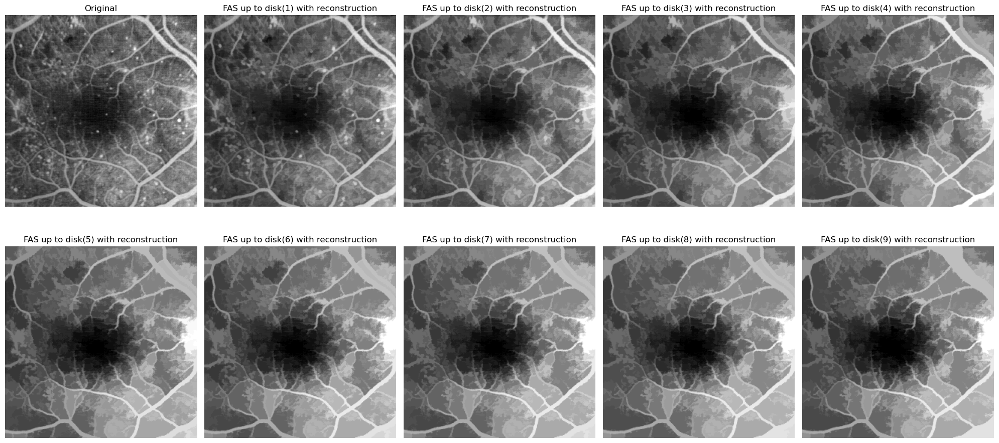

In [19]:
im = skio.imread('./Images/retina2.gif')
im = im[0, :, :]

sizes = np.arange(1, 10)
num_plot = len(sizes)
se_type = 'disk'

plt.figure(figsize=(20, 10))
plt.subplot(num_plot // 5 + 1, 5, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original')

fas = im

for i, size in enumerate(sizes):
    se = strel(se_type, size)
    imopen = morpho.opening(fas, se)
    reco = morpho.reconstruction(imopen, fas, method='dilation')
    imclose = morpho.closing(reco, se)
    fas = morpho.reconstruction(imclose, reco, method='erosion')
    plt.subplot(num_plot // 5 + 1, 5, i+2)
    plt.imshow(fas, cmap='gray')
    plt.axis('off')
    plt.title(f'FAS up to {se_type}({size}) with reconstruction')

plt.tight_layout()
plt.show()

## Part 4: Segmentation

### Question 1

The morphological gradient, computed as the difference between dilation and erosion, highlights object boundaries by emphasizing intensity transitions. Using a structuring element of size 1 ensures precise and thin contours but can also make the gradient sensitive to noise, revealing even minor local variations. As a result, internal details within objects are reduced, focusing primarily on edges. When applied to the image *bat200.bmp*, the gradient effectively enhances well-defined shapes and high-contrast areas, though smoother transitions or noisy regions may introduce some granularity. This technique is powerful for edge detection but may require adjustments for noisy images.

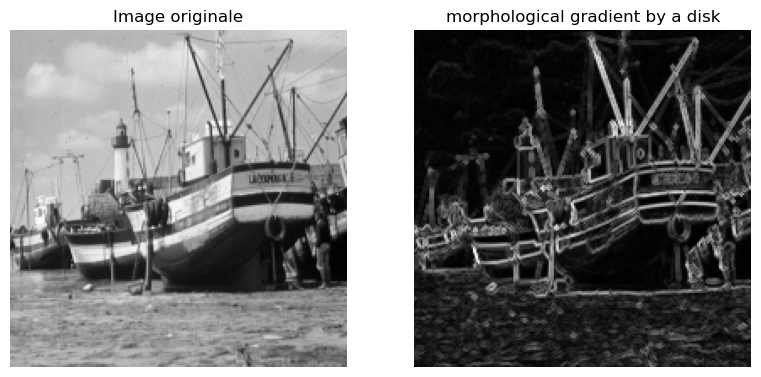

In [20]:
im = skio.imread('./Images/bat200.bmp')
im = gris_depuis_couleur(im)

se = strel("disk", 1)
dil = morpho.dilation(im, se)
ero = morpho.erosion(im, se)
Gradient = dil - ero

# Display the result
plt.figure(figsize=(20, 20))

plt.subplot(1, 4, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Image originale')

plt.subplot(1, 4, 2)
plt.imshow(Gradient, cmap='gray')
plt.axis('off')
plt.title('morphological gradient by a disk')
plt.show()

### Question 2

Although we start to get some of the contours from the image, this first approach to segmentation doesn't produce the best results. There's a lot of small structures, like the detail in the sea, that get's interpreted as a contour, and in general the contours we find are very irregular.

We observe that we need to threshold the gradient to get a decent result. The effects of the value of this threshold will be explored in Question 4.

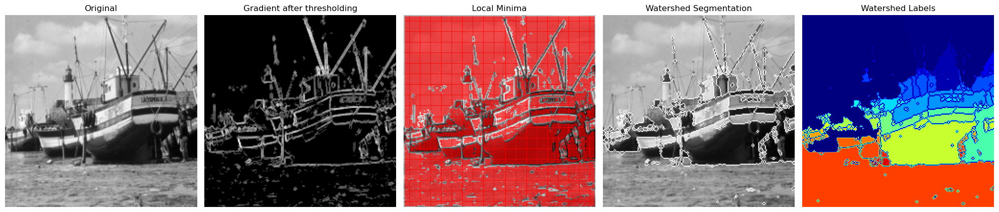

In [21]:
im = skio.imread('./Images/bat200.bmp')
im = gris_depuis_couleur(im)

se = strel('disk', 1)

grad = morpho.dilation(im, se) - morpho.erosion(im, se)

# Threshold the gradient image
thresh = 40
grad = np.int32(grad > thresh) * grad

local_mini = skf.peak_local_max(255 - grad, min_distance = 1)

# Create markers for the watershed
markers = np.zeros_like(im)
markers[local_mini[:, 0], local_mini[:, 1]] = 1
markers = ndi.label(markers)[0]

labels = watershed(grad, markers, watershed_line=True)
segm = labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0: 
            segm[i,j] = 255
        else:
            segm[i,j] = 0

plt.figure(figsize=(20, 10))

# Plot the original image
plt.subplot(1, 5, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original') 

# Plot the gradient after thresholding
plt.subplot(1, 5, 2)
plt.imshow(grad, cmap='gray')
plt.axis('off')
plt.title('Gradient after thresholding')

# Plot the positions of the local minima
plt.subplot(1, 5, 3)
plt.imshow(im, cmap='gray')
plt.plot(local_mini[:, 1], local_mini[:, 0], 'r.', markersize=1)
plt.axis('off')
plt.title('Local Minima')

# Plot the contours of the watershed over the original image
plt.subplot(1, 5, 4)
plt.imshow(np.maximum(im, segm), cmap='gray')
plt.axis('off')
plt.title('Watershed Segmentation')

# Plot the watershed segmentation
plt.subplot(1, 5, 5)
plt.imshow(labels, cmap='jet')
plt.axis('off')
plt.title('Watershed Labels')

plt.tight_layout()
plt.show()

### Question 3

In this section we use the results found in question 5 part 1, using opening with line segments in different directions denoises the image by removing small, irrelevant details while preserving essential structures. This is beneficial for segmentation because it reduces noise that could interfere with accurate boundary detection, ensuring that only meaningful edges are retained. The use of line segments in multiple orientations makes the process sensitive to edges in all directions, enhancing the ability to detect object contours more reliably. As a result, the segmentation becomes more precise, focusing on the actual shapes and structures in the image rather than being misled by noise or minor intensity variations.

In [22]:
def Denoising_Lines(image) :   
        se_0=strel("line",6,0)
        se_45=strel("line",6,45)
        se_90=strel("line",6,90)
        se_135=strel("line",6,135)
        open_0=morpho.opening(image, se_0)
        open_45=morpho.opening(image, se_45)
        open_90=morpho.opening(image, se_90)
        open_135=morpho.opening(image, se_135)

        # Compute the point-wise maximum of all the opened images
        max_opening = np.maximum.reduce([open_0, open_45, open_90, open_135])
        return max_opening

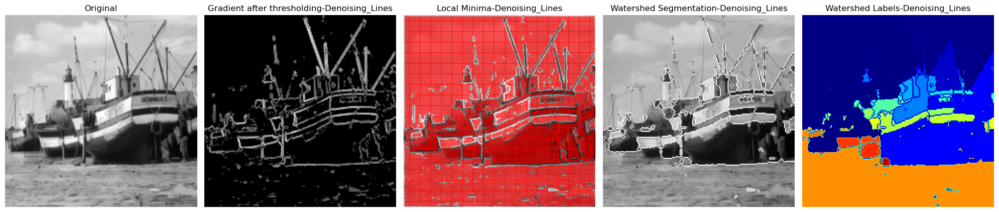

In [23]:
#Compute the watershed with only Denoising_Lines as pre-processing filter
im = skio.imread('./Images/bat200.bmp')
im = gris_depuis_couleur(im)

im = Denoising_Lines(im)
se = strel('disk', 1)

grad = morpho.dilation(im, se) - morpho.erosion(im, se)


# Threshold the gradient image
thresh = 40
grad = np.int32(grad > thresh) * grad

local_mini = skf.peak_local_max(255 - grad, min_distance = 1)

# Create markers for the watershed
markers = np.zeros_like(im)
markers[local_mini[:, 0], local_mini[:, 1]] = 1
markers = ndi.label(markers)[0]

labels = watershed(grad, markers, watershed_line=True)
segm = labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0: 
            segm[i,j] = 255
        else:
            segm[i,j] = 0

plt.figure(figsize=(20, 10))

# Plot the original image
plt.subplot(1, 5, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original') 

# Plot the gradient after thresholding
plt.subplot(1, 5, 2)
plt.imshow(grad, cmap='gray')
plt.axis('off')
plt.title('Gradient after thresholding-Denoising_Lines')

# Plot the positions of the local minima
plt.subplot(1, 5, 3)
plt.imshow(im, cmap='gray')
plt.plot(local_mini[:, 1], local_mini[:, 0], 'r.', markersize=1)
plt.axis('off')
plt.title('Local Minima-Denoising_Lines')

# Plot the contours of the watershed over the original image
plt.subplot(1, 5, 4)
plt.imshow(np.maximum(im, segm), cmap='gray')
plt.axis('off')
plt.title('Watershed Segmentation-Denoising_Lines')

# Plot the watershed segmentation
plt.subplot(1, 5, 5)
plt.imshow(labels, cmap='jet')
plt.axis('off')
plt.title('Watershed Labels-Denoising_Lines')

plt.tight_layout()
plt.show()

Applying closing to the gradient image helps in segmentation by filling small gaps and connecting broken edges. This ensures that fragmented contours or boundaries become continuous, making it easier to identify complete objects or regions. Closing also smooths out small dark artifacts along edges, leading to cleaner and more accurate segmentation.

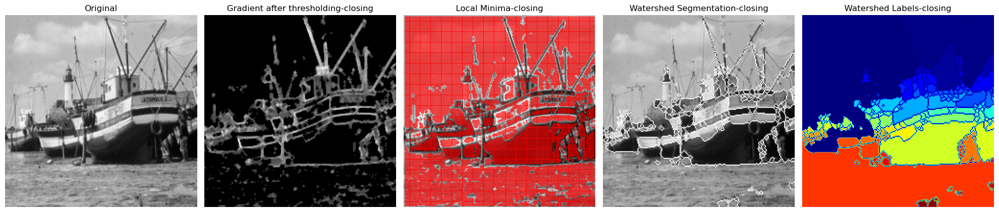

In [24]:
im = skio.imread('./Images/bat200.bmp')
im = gris_depuis_couleur(im)

se = strel('disk', 1)

grad = morpho.dilation(im, se) - morpho.erosion(im, se)

# Threshold the gradient image
thresh = 40
grad = np.int32(grad > thresh) * grad
grad=morpho.closing(grad,se)

local_mini = skf.peak_local_max(255 - grad, min_distance = 1)

# Create markers for the watershed
markers = np.zeros_like(im)
markers[local_mini[:, 0], local_mini[:, 1]] = 1
markers = ndi.label(markers)[0]

labels = watershed(grad, markers, watershed_line=True)
segm = labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0: 
            segm[i,j] = 255
        else:
            segm[i,j] = 0

plt.figure(figsize=(20, 10))

# Plot the original image
plt.subplot(1, 5, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original') 

# Plot the gradient after thresholding
plt.subplot(1, 5, 2)
plt.imshow(grad, cmap='gray')
plt.axis('off')
plt.title('Gradient after thresholding-closing')

# Plot the positions of the local minima
plt.subplot(1, 5, 3)
plt.imshow(im, cmap='gray')
plt.plot(local_mini[:, 1], local_mini[:, 0], 'r.', markersize=1)
plt.axis('off')
plt.title('Local Minima-closing')

# Plot the contours of the watershed over the original image
plt.subplot(1, 5, 4)
plt.imshow(np.maximum(im, segm), cmap='gray')
plt.axis('off')
plt.title('Watershed Segmentation-closing')

# Plot the watershed segmentation
plt.subplot(1, 5, 5)
plt.imshow(labels, cmap='jet')
plt.axis('off')
plt.title('Watershed Labels-closing')

plt.tight_layout()
plt.show()

Applying reconstruction by dilation improves segmentation by emphasizing and preserving the main contours of objects while flattening peak intensities. This process removes small intensity variations and noise, creating a cleaner representation that enhances boundary definition. As a result, it helps distinguish objects from the background more accurately, leading to improved segmentation quality.

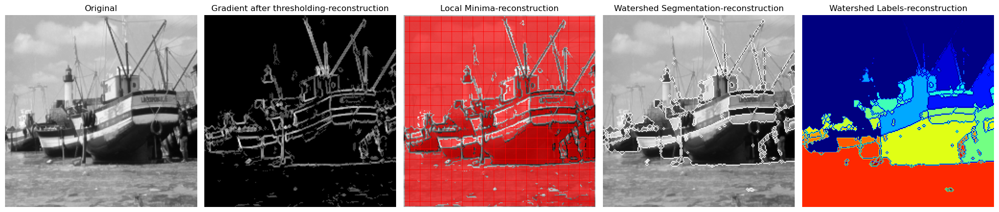

In [25]:
im = skio.imread('./Images/bat200.bmp')
im = gris_depuis_couleur(im)

se = strel('disk', 1)
open2 = morpho.closing(im,se)
im=morpho.reconstruction(open2,im,method='erosion')
grad = morpho.dilation(im, se) - morpho.erosion(im, se)

# Threshold the gradient image
thresh = 40
grad = np.int32(grad > thresh) * grad

local_mini = skf.peak_local_max(255 - grad, min_distance = 1)

# Create markers for the watershed
markers = np.zeros_like(im)
markers[local_mini[:, 0], local_mini[:, 1]] = 1
markers = ndi.label(markers)[0]

labels = watershed(grad, markers, watershed_line=True)
segm = labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0: 
            segm[i,j] = 255
        else:
            segm[i,j] = 0

plt.figure(figsize=(20, 10))

# Plot the original image
plt.subplot(1, 5, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original') 

# Plot the gradient after thresholding
plt.subplot(1, 5, 2)
plt.imshow(grad, cmap='gray')
plt.axis('off')
plt.title('Gradient after thresholding-reconstruction')

# Plot the positions of the local minima
plt.subplot(1, 5, 3)
plt.imshow(im, cmap='gray')
plt.plot(local_mini[:, 1], local_mini[:, 0], 'r.', markersize=1)
plt.axis('off')
plt.title('Local Minima-reconstruction')

# Plot the contours of the watershed over the original image
plt.subplot(1, 5, 4)
plt.imshow(np.maximum(im, segm), cmap='gray')
plt.axis('off')
plt.title('Watershed Segmentation-reconstruction')

# Plot the watershed segmentation
plt.subplot(1, 5, 5)
plt.imshow(labels, cmap='jet')
plt.axis('off')
plt.title('Watershed Labels-reconstruction')

plt.tight_layout()
plt.show()

Let’s combine the advantages of the three filters.

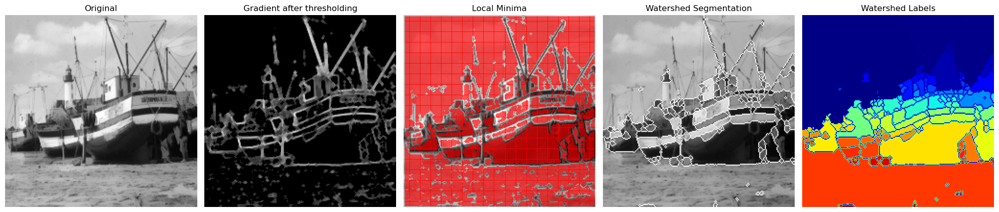

In [26]:
im = skio.imread('./Images/bat200.bmp')
im = gris_depuis_couleur(im)

im = Denoising_Lines(im)
se = strel('disk', 1)
open2 = morpho.opening(im,se)
im = morpho.reconstruction(open2,im,method='dilation')
grad = morpho.dilation(im, se) - morpho.erosion(im, se)

# Threshold the gradient image
thresh = 30
grad = np.int32(grad > thresh) * grad
grad=morpho.closing(grad,se)
local_mini = skf.peak_local_max(255 - grad, min_distance = 1)

# Create markers for the watershed
markers = np.zeros_like(im)
markers[local_mini[:, 0], local_mini[:, 1]] = 1
markers = ndi.label(markers)[0]

labels = watershed(grad, markers, watershed_line=True)
segm = labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0: 
            segm[i,j] = 255
        else:
            segm[i,j] = 0

plt.figure(figsize=(20, 10))

# Plot the original image
plt.subplot(1, 5, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original') 

# Plot the gradient after thresholding
plt.subplot(1, 5, 2)
plt.imshow(grad, cmap='gray')
plt.axis('off')
plt.title('Gradient after thresholding')

# Plot the positions of the local minima
plt.subplot(1, 5, 3)
plt.imshow(im, cmap='gray')
plt.plot(local_mini[:, 1], local_mini[:, 0], 'r.', markersize=1)
plt.axis('off')
plt.title('Local Minima')

# Plot the contours of the watershed over the original image
plt.subplot(1, 5, 4)
plt.imshow(np.maximum(im, segm), cmap='gray')
plt.axis('off')
plt.title('Watershed Segmentation')

# Plot the watershed segmentation
plt.subplot(1, 5, 5)
plt.imshow(labels, cmap='jet')
plt.axis('off')
plt.title('Watershed Labels')

plt.tight_layout()
plt.show()

### Question 4

We can observe the effects of different threshold values in the figure below. The sequence of operations is:

1. Compute the morphological gradient.
2. Threshold the gradient image.
3. Apply watershed on the thresholded image.

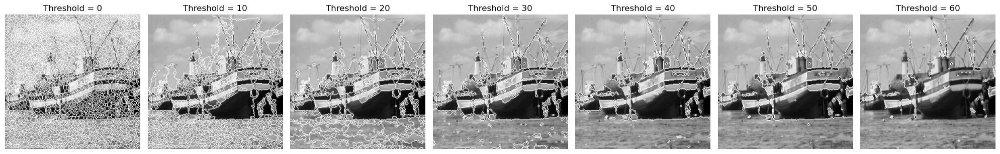

In [27]:
# Apply watershed on gradients with different thresholds
thresholds = [0, 10, 20, 30, 40, 50, 60]

im = skio.imread('./Images/bat200.bmp')
im = gris_depuis_couleur(im)

se = strel('disk', 1)

grad = morpho.dilation(im, se) - morpho.erosion(im, se)

plt.figure(figsize=(20, 10))

for k, thresh in enumerate(thresholds):
    grad = np.int32(grad > thresh) * grad
    local_mini = skf.peak_local_max(255 - grad, min_distance = 1)

    # Create markers for the watershed
    markers = np.zeros_like(im)
    markers[local_mini[:, 0], local_mini[:, 1]] = 1
    markers = ndi.label(markers)[0]

    labels = watershed(grad, markers, watershed_line=True)
    segm = labels.copy()
    for i in range(segm.shape[0]):
        for j in range(segm.shape[1]):
            if segm[i,j] == 0: 
                segm[i,j] = 255
            else:
                segm[i,j] = 0
    
    plt.subplot(1, 7, k+1)
    plt.imshow(np.maximum(im, segm), cmap='gray')
    plt.axis('off')
    plt.title(f'Threshold = {thresh}')

plt.tight_layout()
plt.show()

### Question 5

By defining markers both inside and outside the object, we guide the watershed algorithm to focus only on relevant regions. Setting the marker values to 0 within these regions and 255 elsewhere ensures that the erosion-based reconstruction only preserves the intended minima. As a result, the watershed segmentation becomes more robust, preventing over-segmentation by avoiding the creation of unnecessary boundaries in noisy or ambiguous areas.

In the case of the reconstructed image, since minima exist only where markers were defined, the watershed algorithm can now better delineate objects by following these controlled regions. This yields cleaner, more meaningful segmentation, especially for images with complex textures or low contrast.

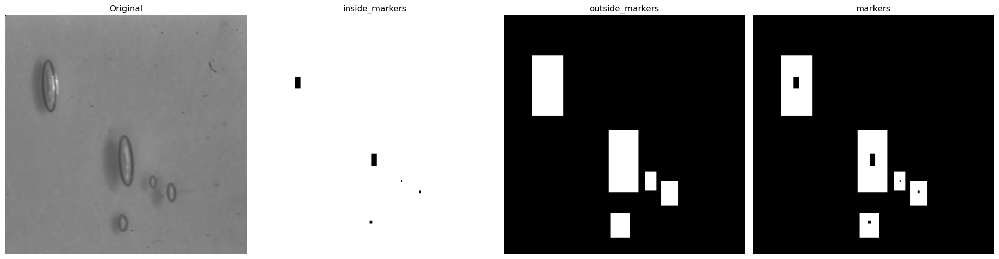

In [28]:
im = skio.imread('Images/bulles.bmp')
im = gris_depuis_couleur(im)

#Define markers
inside_markers = np.zeros_like(im)
inside_markers += 255
inside_markers[66:78,43:49] = 0  
inside_markers[147:160,124:129] = 0  
inside_markers[218:221, 122:125] = 0 
inside_markers[175:177,155:156] = 0  
inside_markers[186:189,174:176] = 0   

outside_markers = np.zeros_like(im)
outside_markers[43:107,30:63] = 255
outside_markers[122:188,111:142] = 255
outside_markers[166:186,149:161] = 255
outside_markers[176:202,166:184] = 255
outside_markers[210:236,113:133] = 255

# Combine the markers
markers = np.minimum(inside_markers,outside_markers)

plt.figure(figsize=(20, 10))

# Plot the original image
plt.subplot(1, 4, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original') 

# Plot the gradient after thresholding
plt.subplot(1, 4, 2)
plt.imshow(inside_markers, cmap='gray')
plt.axis('off')
plt.title('inside_markers')

# Plot the positions of the local minima
plt.subplot(1, 4, 3)
plt.imshow(outside_markers, cmap='gray')
plt.axis('off')
plt.title('outside_markers')

# Plot the contours of the watershed over the original image
plt.subplot(1, 4, 4)
plt.imshow(markers ,cmap='gray')
plt.axis('off')
plt.title('markers')

plt.tight_layout()
plt.show()

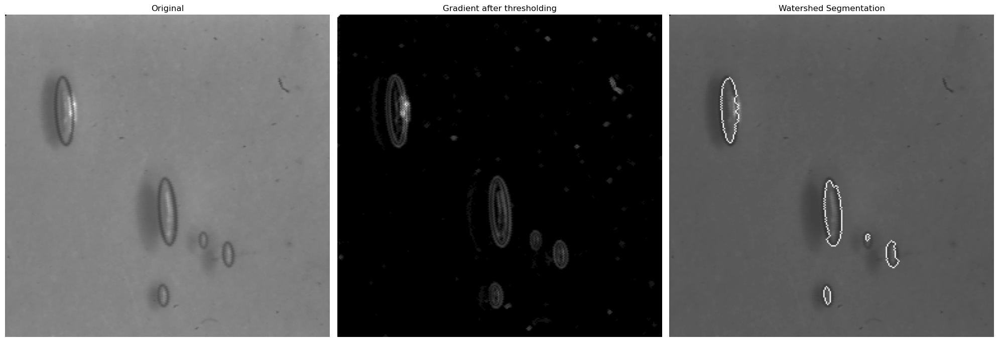

In [29]:
se = strel('disk', 1)
grad = morpho.dilation(im, se) - morpho.erosion(im, se)

# Threshold the gradient image
thresh = 5
grad = np.int32(grad > thresh) * grad

I_intersection = np.minimum(grad, markers)
im_reconstructed = morpho.reconstruction(markers,I_intersection,method='erosion')
peak_mask = np.zeros_like(grad, dtype=bool)
peak_mask[markers==0] = True
markers2, _ = measure.label(peak_mask, return_num = True)

labels = watershed(im_reconstructed, markers2, watershed_line=True)

segm = labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0: 
            segm[i,j] = 255
        else:
            segm[i,j] = 0

contourSup = np.maximum(segm, im)
plt.figure(figsize=(20, 10))

# Plot the original image
plt.subplot(1, 3, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original') 

# Plot the gradient after thresholding
plt.subplot(1, 3, 2)
plt.imshow(grad, cmap='gray')
plt.axis('off')
plt.title('Gradient after thresholding')

# Plot the contours of the watershed over the original image
plt.subplot(1, 3, 3)
plt.imshow(contourSup, cmap='gray')
plt.axis('off')
plt.title('Watershed Segmentation')

plt.tight_layout()
plt.show()

### Question 6

The proposed pipeline for segmenting the black lines in `laiton.bmp` is the following:
- Apply a sequential alternating filter with intermediate reconstruction steps.
- Compute the morphological gradient of the filtered image.
- Threshold the obtained gradient.
- Apply closing with reconstruction on the thresholded gradient to close small holes. 
- Use the obtained filtered gradient to perform the watershed transform.

The results can be observed below. Note there are multiple hyper-parameters to optimize this process.

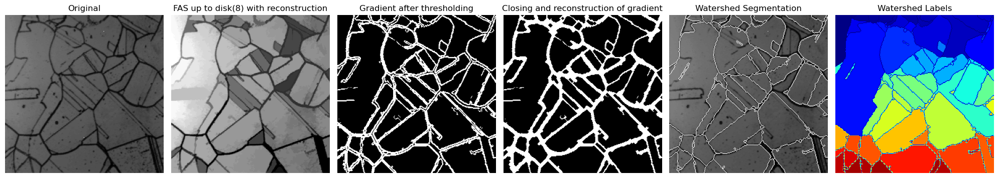

In [30]:
im = skio.imread('./Images/laiton.bmp')
im = gris_depuis_couleur(im)

############################################
# Apply alternate sequential filter with disk structuring elements and reconstruction
max_iter = 8
se_type = 'disk'

fas = im

for i in range(2, max_iter):
    se = strel(se_type, i)
    imopen = morpho.opening(fas, se)
    reco = morpho.reconstruction(imopen, fas, method='dilation')
    imclose = morpho.closing(reco, se)
    fas = morpho.reconstruction(imclose, reco, method='erosion')

############################################
# Compute the gradient and threshold it
se = strel('disk', 1)
grad = morpho.dilation(fas, se) - morpho.erosion(fas, se)
thresh = 10
grad = np.int32(grad > thresh)

############################################
# Apply closing and reconstruction to the gradient
se = strel('disk', 2)
imclose = morpho.closing(grad, se)
reco = morpho.reconstruction(imclose, grad, method='erosion')

############################################
# Apply watershed on the reconstructed gradient
local_mini = skf.peak_local_max(255 - reco, min_distance = 1)
markers = np.zeros_like(imclose)
markers[local_mini[:, 0], local_mini[:, 1]] = 1
markers = ndi.label(markers)[0]

labels = watershed(grad, markers, watershed_line=True, compactness=0.001)
segm = labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0: 
            segm[i,j] = 255
        else:
            segm[i,j] = 0

############################################
# Plot the results of the pipeline

plt.figure(figsize=(20, 10))
plt.subplot(1, 6, 1)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.title('Original')

plt.subplot(1, 6, 2)
plt.imshow(fas, cmap='gray')
plt.axis('off')
plt.title(f'FAS up to {se_type}({max_iter}) with reconstruction')

plt.subplot(1, 6, 3)
plt.imshow(grad, cmap='gray')
plt.axis('off')
plt.title('Gradient after thresholding')

plt.subplot(1, 6, 4)
plt.imshow(imclose, cmap='gray')
plt.axis('off')
plt.title('Closing and reconstruction of gradient')

plt.subplot(1, 6, 5)
plt.imshow(np.maximum(im, segm), cmap='gray')
plt.axis('off')
plt.title('Watershed Segmentation')

plt.subplot(1, 6, 6)
plt.imshow(labels, cmap='jet')
plt.axis('off')
plt.title('Watershed Labels')

plt.tight_layout()
plt.show()